In [1]:
import os
import rasterio
import pandas as pd
import numpy as np

In [2]:
# Usage
base_directory = "./data/SEN12FLOOD"
# total_bytes = compute_total_memory_footprint(base_directory)

# print(f"Total memory footprint: {total_bytes / (1024 * 1024):.2f} MB")

In [3]:
import json
with open("./data/SEN12FLOOD/S1list.json", "r") as file:
    s1_data = json.load(file)
s1_data

{'0063': {'count': 2,
  '2': {'date': '2019-02-09',
   'FLOODING': False,
   'orbit': 'ASCENDING',
   'filename': 'S1B_IW_GRDH_1SDV_20190209T163240_20190209T163305_014871_01BC1F_7E74'},
  '1': {'date': '2019-01-28',
   'FLOODING': False,
   'orbit': 'ASCENDING',
   'filename': 'S1B_IW_GRDH_1SDV_20190128T163241_20190128T163306_014696_01B65E_5615'},
  'folder': '0063',
  'geo': {'type': 'Polygon',
   'coordinates': [[[28.29722, -15.382762],
     [28.297507, -15.429039],
     [28.345216, -15.428755],
     [28.344918, -15.382479],
     [28.29722, -15.382762]]]},
  'urls': ['https://datapool.asf.alaska.edu/GRD_HD/SB/S1B_IW_GRDH_1SDV_20190209T163240_20190209T163305_014871_01BC1F_7E74.zip',
   'https://datapool.asf.alaska.edu/GRD_HD/SB/S1B_IW_GRDH_1SDV_20190128T163241_20190128T163306_014696_01B65E_5615.zip']},
 '0200': {'count': 14,
  '14': {'date': '2019-04-24',
   'FLOODING': True,
   'orbit': 'DESCENDING',
   'filename': 'S1A_IW_GRDH_1SDV_20190424T031707_20190424T031732_026926_03077A_B45D'

In [4]:
columns = ["folder", "filename", "date", "flooding", "orbit", "geo_type", "geo_coordinates", "vv_file_path", "vh_file_path",]
records = []
for value in s1_data.values():
    folder = value["folder"]
    geo_type = value["geo"]["type"]
    geo_coordinates = value["geo"]["coordinates"]
    count = value["count"]
    file_dir = os.path.join(base_directory, folder)
    for i in range(1, count+1):
        sub_value = value[str(i)]
        vv_file_path = os.path.join(file_dir,  f"{sub_value['filename']}_corrected_VV.tif")
        vh_file_path = os.path.join(file_dir,  f"{sub_value['filename']}_corrected_VH.tif")
        record = {"folder": folder,
                  "filename": sub_value['filename'],
                  "date": sub_value["date"],
                  "flooding": sub_value["FLOODING"],
                  "orbit": sub_value["orbit"],
                  "geo_type": geo_type,
                  "geo_coordinates": geo_coordinates,
                  "vv_file_path": vv_file_path,
                 "vh_file_path": vh_file_path}
        records.append(record)
    
s1_df = pd.DataFrame(records)
s1_df

,folder,filename,date,flooding,orbit,geo_type,geo_coordinates,vv_file_path,vh_file_path
0,0063,S1B_IW_GRDH_1SDV_20190128T163241_20190128T1633...,2019-01-28,False,ASCENDING,Polygon,"[[[28.29722, -15.382762], [28.297507, -15.4290...",./data/SEN12FLOOD/0063/S1B_IW_GRDH_1SDV_201901...,./data/SEN12FLOOD/0063/S1B_IW_GRDH_1SDV_201901...
1,0063,S1B_IW_GRDH_1SDV_20190209T163240_20190209T1633...,2019-02-09,False,ASCENDING,Polygon,"[[[28.29722, -15.382762], [28.297507, -15.4290...",./data/SEN12FLOOD/0063/S1B_IW_GRDH_1SDV_201902...,./data/SEN12FLOOD/0063/S1B_IW_GRDH_1SDV_201902...
2,0200,S1A_IW_GRDH_1SDV_20190223T031705_20190223T0317...,2019-02-23,False,DESCENDING,Polygon,"[[[32.629207, -20.150871], [32.629098, -20.197...",./data/SEN12FLOOD/0200/S1A_IW_GRDH_1SDV_201902...,./data/SEN12FLOOD/0200/S1A_IW_GRDH_1SDV_201902...
3,0200,S1B_IW_GRDH_1SDV_20190228T162250_20190228T1623...,2019-02-28,False,ASCENDING,Polygon,"[[[32.629207, -20.150871], [32.629098, -20.197...",./data/SEN12FLOOD/0200/S1B_IW_GRDH_1SDV_201902...,./data/SEN12FLOOD/0200/S1B_IW_GRDH_1SDV_201902...
4,0200,S1A_IW_GRDH_1SDV_20190307T031705_20190307T0317...,2019-03-07,False,DESCENDING,Polygon,"[[[32.629207, -20.150871], [32.629098, -20.197...",./data/SEN12FLOOD/0200/S1A_IW_GRDH_1SDV_201903...,./data/SEN12FLOOD/0200/S1A_IW_GRDH_1SDV_201903...
...,...,...,...,...,...,...,...,...,...
3952,29,S1A_IW_GRDH_1SDV_20190126T160455_20190126T1605...,2019-01-26,False,ASCENDING,Polygon,"[[[32.479305, 0.35084], [32.479308, 0.30452], ...",./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190126...,./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190126...
3953,29,S1A_IW_GRDH_1SDV_20190131T161246_20190131T1613...,2019-01-31,False,ASCENDING,Polygon,"[[[32.479305, 0.35084], [32.479308, 0.30452], ...",./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190131...,./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190131...
3954,29,S1A_IW_GRDH_1SDV_20190202T033603_20190202T0336...,2019-02-02,False,DESCENDING,Polygon,"[[[32.479305, 0.35084], [32.479308, 0.30452], ...",./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190202...,./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190202...
3955,29,S1A_IW_GRDH_1SDV_20190207T160454_20190207T1605...,2019-02-07,False,ASCENDING,Polygon,"[[[32.479305, 0.35084], [32.479308, 0.30452], ...",./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190207...,./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190207...


In [5]:
def file_exists(file_path):
    return os.path.exists(file_path)

s1_df['vv_file_exists'] = s1_df['vv_file_path'].apply(file_exists)
s1_df['vh_file_exists'] = s1_df['vh_file_path'].apply(file_exists)

In [6]:
s1_df

,folder,filename,date,flooding,orbit,geo_type,geo_coordinates,vv_file_path,vh_file_path,vv_file_exists,vh_file_exists
0,0063,S1B_IW_GRDH_1SDV_20190128T163241_20190128T1633...,2019-01-28,False,ASCENDING,Polygon,"[[[28.29722, -15.382762], [28.297507, -15.4290...",./data/SEN12FLOOD/0063/S1B_IW_GRDH_1SDV_201901...,./data/SEN12FLOOD/0063/S1B_IW_GRDH_1SDV_201901...,True,True
1,0063,S1B_IW_GRDH_1SDV_20190209T163240_20190209T1633...,2019-02-09,False,ASCENDING,Polygon,"[[[28.29722, -15.382762], [28.297507, -15.4290...",./data/SEN12FLOOD/0063/S1B_IW_GRDH_1SDV_201902...,./data/SEN12FLOOD/0063/S1B_IW_GRDH_1SDV_201902...,True,True
2,0200,S1A_IW_GRDH_1SDV_20190223T031705_20190223T0317...,2019-02-23,False,DESCENDING,Polygon,"[[[32.629207, -20.150871], [32.629098, -20.197...",./data/SEN12FLOOD/0200/S1A_IW_GRDH_1SDV_201902...,./data/SEN12FLOOD/0200/S1A_IW_GRDH_1SDV_201902...,True,True
3,0200,S1B_IW_GRDH_1SDV_20190228T162250_20190228T1623...,2019-02-28,False,ASCENDING,Polygon,"[[[32.629207, -20.150871], [32.629098, -20.197...",./data/SEN12FLOOD/0200/S1B_IW_GRDH_1SDV_201902...,./data/SEN12FLOOD/0200/S1B_IW_GRDH_1SDV_201902...,True,True
4,0200,S1A_IW_GRDH_1SDV_20190307T031705_20190307T0317...,2019-03-07,False,DESCENDING,Polygon,"[[[32.629207, -20.150871], [32.629098, -20.197...",./data/SEN12FLOOD/0200/S1A_IW_GRDH_1SDV_201903...,./data/SEN12FLOOD/0200/S1A_IW_GRDH_1SDV_201903...,True,True
...,...,...,...,...,...,...,...,...,...,...,...
3952,29,S1A_IW_GRDH_1SDV_20190126T160455_20190126T1605...,2019-01-26,False,ASCENDING,Polygon,"[[[32.479305, 0.35084], [32.479308, 0.30452], ...",./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190126...,./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190126...,True,True
3953,29,S1A_IW_GRDH_1SDV_20190131T161246_20190131T1613...,2019-01-31,False,ASCENDING,Polygon,"[[[32.479305, 0.35084], [32.479308, 0.30452], ...",./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190131...,./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190131...,True,True
3954,29,S1A_IW_GRDH_1SDV_20190202T033603_20190202T0336...,2019-02-02,False,DESCENDING,Polygon,"[[[32.479305, 0.35084], [32.479308, 0.30452], ...",./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190202...,./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190202...,True,True
3955,29,S1A_IW_GRDH_1SDV_20190207T160454_20190207T1605...,2019-02-07,False,ASCENDING,Polygon,"[[[32.479305, 0.35084], [32.479308, 0.30452], ...",./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190207...,./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190207...,True,True


In [7]:
def get_width(row, band):
    file_exists = f'{band}_file_exists'
    file_path =f'{band}_file_path'
    if not row[file_exists]:
        return None
    with rasterio.open(row[file_path]) as src:
        return src.width
    
def get_height(row, band):
    file_exists = f'{band}_file_exists'
    file_path =f'{band}_file_path'
    if not row[file_exists]:
        return None
    with rasterio.open(row[file_path]) as src:
        return src.height

s1_df['vv_height'] = s1_df.apply(lambda row: get_height(row, 'vv'), axis=1)
s1_df['vh_height'] = s1_df.apply(lambda row: get_height(row, 'vh'), axis=1)
s1_df['vv_width'] = s1_df.apply(lambda row: get_width(row, 'vv'), axis=1)
s1_df['vh_width'] = s1_df.apply(lambda row: get_width(row, 'vh'), axis=1)

In [8]:
s1_df

,folder,filename,date,flooding,orbit,geo_type,geo_coordinates,vv_file_path,vh_file_path,vv_file_exists,vh_file_exists,vv_height,vh_height,vv_width,vh_width
0,0063,S1B_IW_GRDH_1SDV_20190128T163241_20190128T1633...,2019-01-28,False,ASCENDING,Polygon,"[[[28.29722, -15.382762], [28.297507, -15.4290...",./data/SEN12FLOOD/0063/S1B_IW_GRDH_1SDV_201901...,./data/SEN12FLOOD/0063/S1B_IW_GRDH_1SDV_201901...,True,True,518.0,518.0,535.0,535.0
1,0063,S1B_IW_GRDH_1SDV_20190209T163240_20190209T1633...,2019-02-09,False,ASCENDING,Polygon,"[[[28.29722, -15.382762], [28.297507, -15.4290...",./data/SEN12FLOOD/0063/S1B_IW_GRDH_1SDV_201902...,./data/SEN12FLOOD/0063/S1B_IW_GRDH_1SDV_201902...,True,True,519.0,519.0,535.0,535.0
2,0200,S1A_IW_GRDH_1SDV_20190223T031705_20190223T0317...,2019-02-23,False,DESCENDING,Polygon,"[[[32.629207, -20.150871], [32.629098, -20.197...",./data/SEN12FLOOD/0200/S1A_IW_GRDH_1SDV_201902...,./data/SEN12FLOOD/0200/S1A_IW_GRDH_1SDV_201902...,True,True,516.0,516.0,548.0,548.0
3,0200,S1B_IW_GRDH_1SDV_20190228T162250_20190228T1623...,2019-02-28,False,ASCENDING,Polygon,"[[[32.629207, -20.150871], [32.629098, -20.197...",./data/SEN12FLOOD/0200/S1B_IW_GRDH_1SDV_201902...,./data/SEN12FLOOD/0200/S1B_IW_GRDH_1SDV_201902...,True,True,516.0,516.0,548.0,548.0
4,0200,S1A_IW_GRDH_1SDV_20190307T031705_20190307T0317...,2019-03-07,False,DESCENDING,Polygon,"[[[32.629207, -20.150871], [32.629098, -20.197...",./data/SEN12FLOOD/0200/S1A_IW_GRDH_1SDV_201903...,./data/SEN12FLOOD/0200/S1A_IW_GRDH_1SDV_201903...,True,True,517.0,517.0,547.0,547.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3952,29,S1A_IW_GRDH_1SDV_20190126T160455_20190126T1605...,2019-01-26,False,ASCENDING,Polygon,"[[[32.479305, 0.35084], [32.479308, 0.30452], ...",./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190126...,./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190126...,True,True,516.0,516.0,513.0,513.0
3953,29,S1A_IW_GRDH_1SDV_20190131T161246_20190131T1613...,2019-01-31,False,ASCENDING,Polygon,"[[[32.479305, 0.35084], [32.479308, 0.30452], ...",./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190131...,./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190131...,True,True,516.0,516.0,513.0,513.0
3954,29,S1A_IW_GRDH_1SDV_20190202T033603_20190202T0336...,2019-02-02,False,DESCENDING,Polygon,"[[[32.479305, 0.35084], [32.479308, 0.30452], ...",./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190202...,./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190202...,True,True,516.0,516.0,513.0,513.0
3955,29,S1A_IW_GRDH_1SDV_20190207T160454_20190207T1605...,2019-02-07,False,ASCENDING,Polygon,"[[[32.479305, 0.35084], [32.479308, 0.30452], ...",./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190207...,./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190207...,True,True,516.0,516.0,513.0,513.0


In [9]:
import matplotlib.pyplot as plt
# Function to plot histogram for a single image
def plot_histogram(row, range):
    vv_file_path = row['vv_file_path']
    vh_file_path = row['vh_file_path']
    try:
        with rasterio.open(vv_file_path) as src:
            vv_band = src.read(1)

        with rasterio.open(vh_file_path) as src:
            vh_band = src.read(1)
        
        fig, axs = plt.subplots(1, 2, figsize=(15, 5))

        axs[0].hist(vv_band.ravel(), bins=256, range=range)  # Adjust range as needed
        axs[0].set_title(f'Band VV Histogram')
        
        axs[1].hist(vh_band.ravel(), bins=256, range=range)  # Adjust range as needed
        axs[1].set_title(f'Band VH Histogram')

        fig.suptitle(f"File {row['filename']} Pixel Histogram", fontsize=12)
        
        plt.tight_layout()
        plt.savefig(f"{row['filename']}_pixel_histogram.png")
        plt.show()
    except Exception as e:
        print(f"Plot failed {str(e)}")

def visualize_sar_image(row):
    # Open the image file
    vv_file_path = row['vv_file_path']
    vh_file_path = row['vh_file_path']
    try:
        with rasterio.open(vv_file_path) as src:
            # Read the VV and VH bands (assuming they are the first two bands)
            vv_band = src.read(1)
            vv_band = np.sqrt(vv_band)
            vv_band = np.clip(vv_band, 0, 0.6)
    
        with rasterio.open(vh_file_path) as src:
            vh_band = src.read(1)
            vh_band = np.sqrt(vh_band)
            vh_band = np.clip(vh_band, 0, 0.6)
    
            # Plotting
            fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    
            # Visualize VV band
            ax[0].imshow(vv_band, cmap='cubehelix')
            ax[0].set_title('VV Band')
            ax[0].axis('off')
    
            # Visualize VH band
            ax[1].imshow(vh_band, cmap='cubehelix')
            ax[1].set_title('VH Band')
            ax[1].axis('off')

            fig.suptitle(f"File {row['filename']} Visualization", fontsize=12)
            
            plt.savefig(f"{row['filename']}_visualization.png")
            plt.show()
    except Exception as e:
        print(f"Visualization failed {str(e)}")

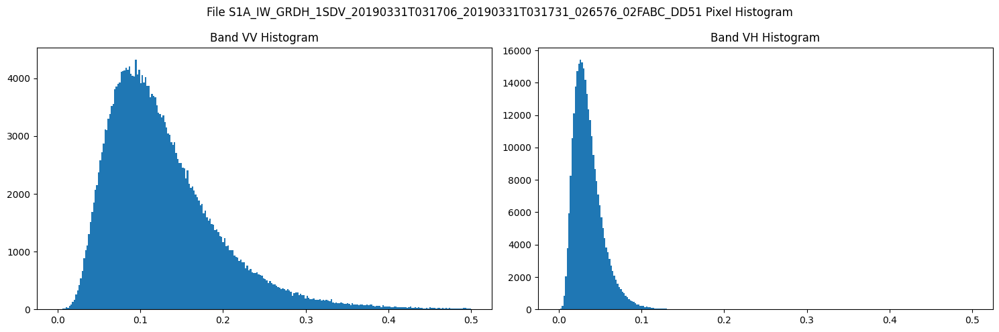

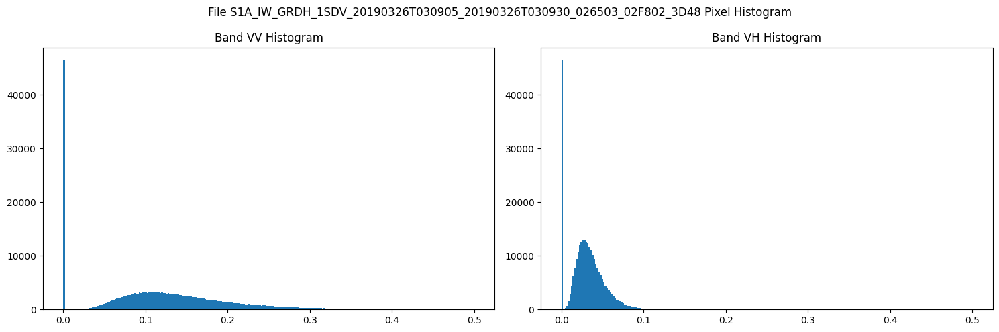

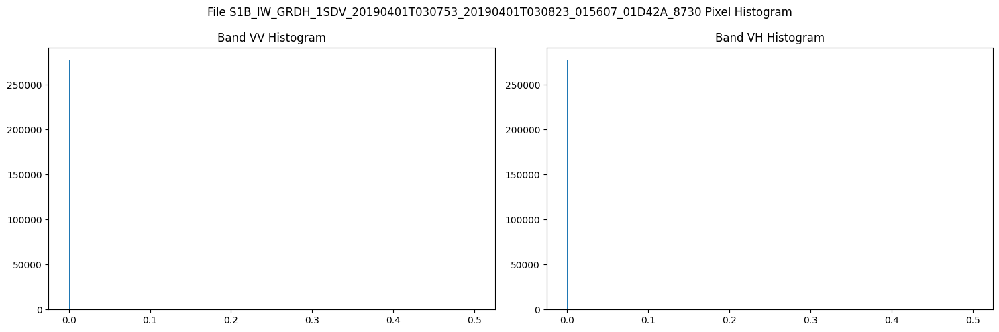

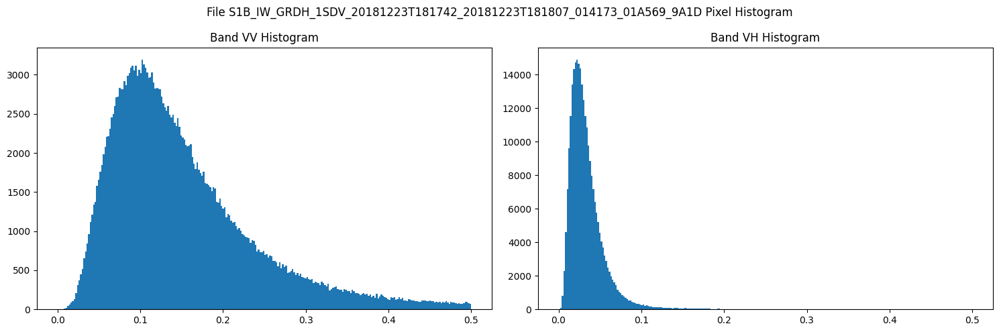

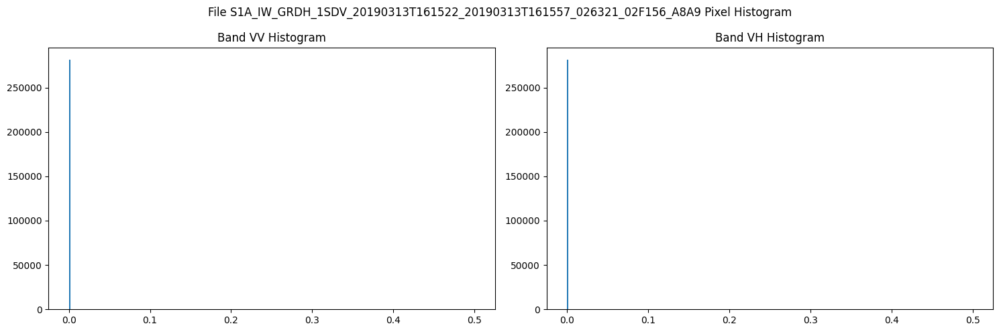

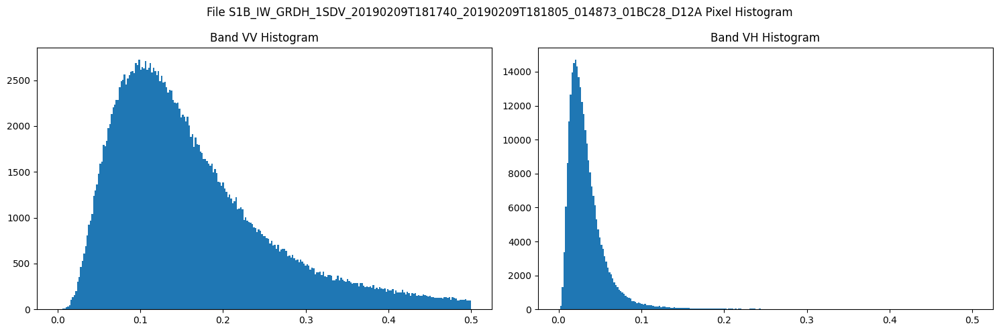

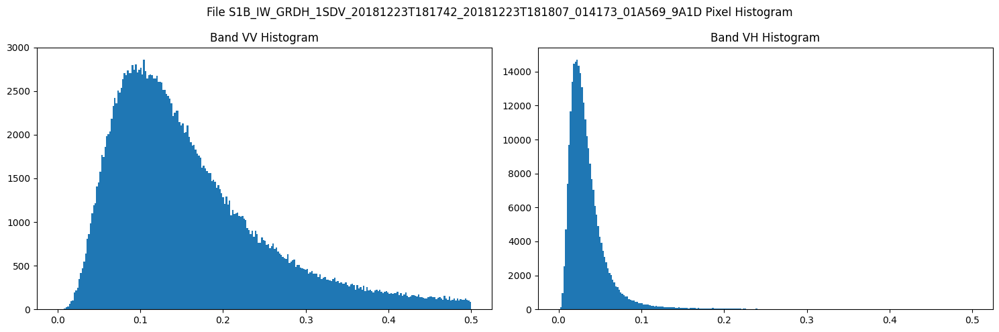

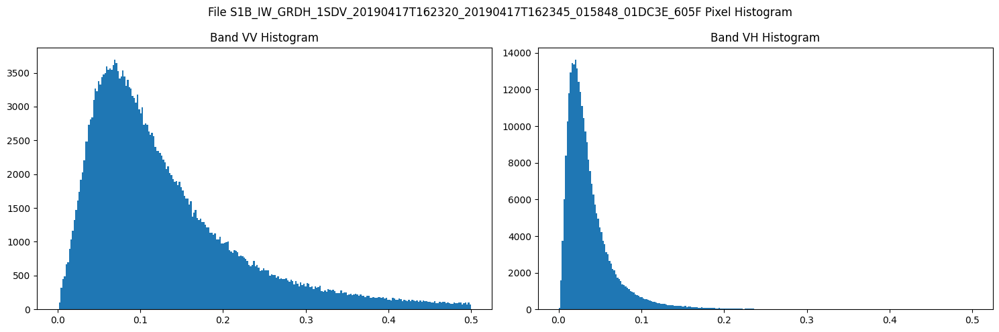

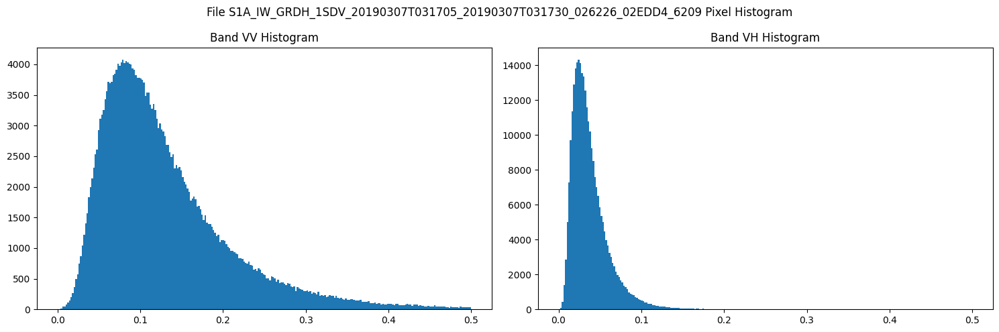

Plot failed ./data/SEN12FLOOD/0124/S1A_IW_GRDH_1SDV_20190106T031846_20190106T031913_025351_02CE5C_29D0_corrected_VV.tif: No such file or directory


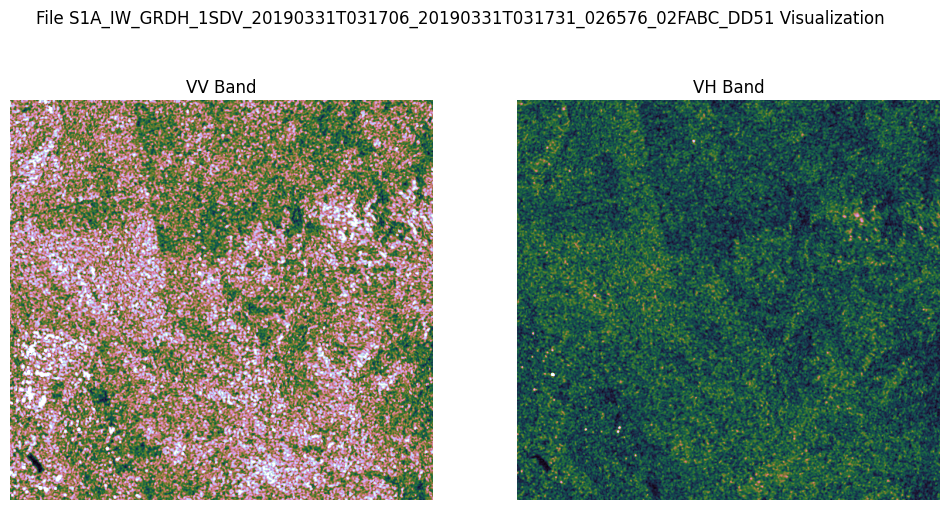

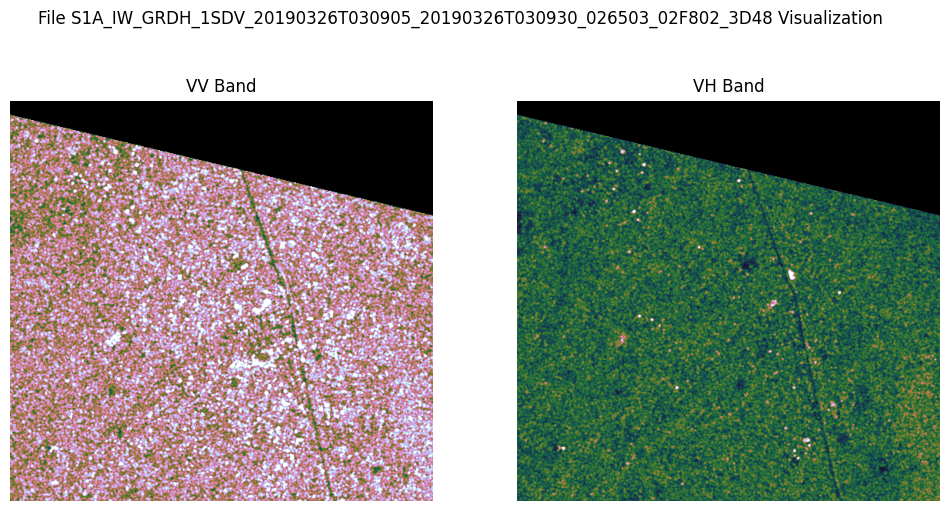

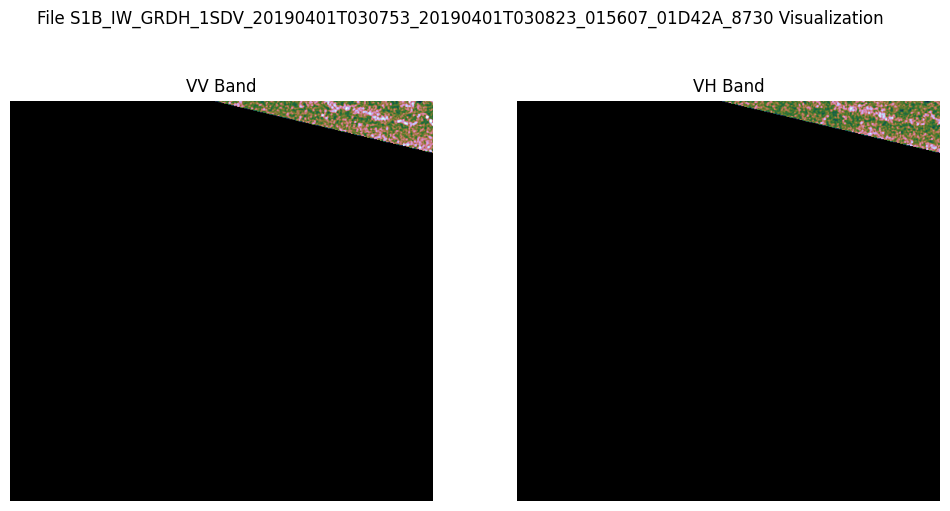

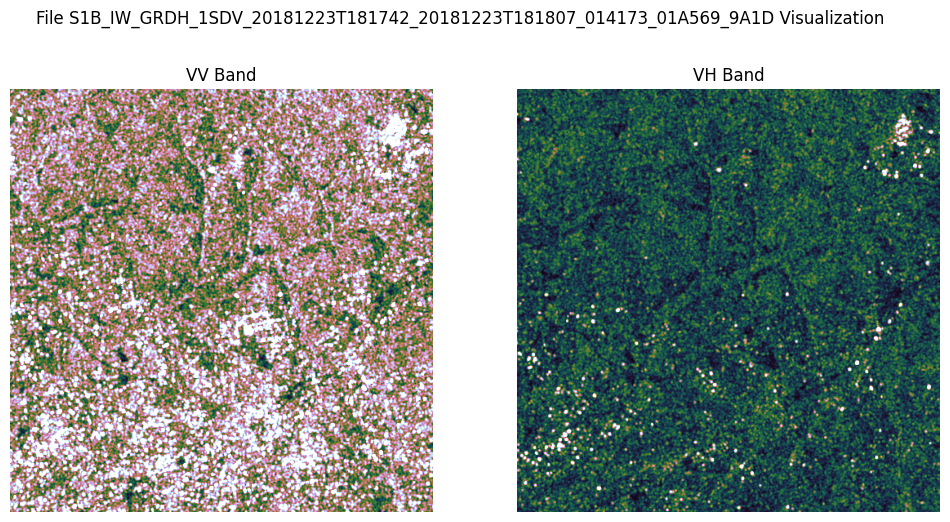

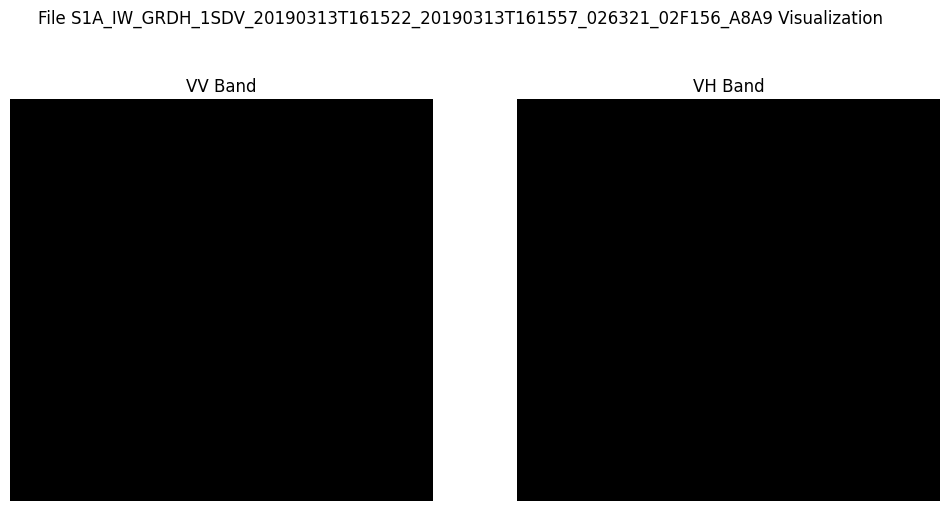

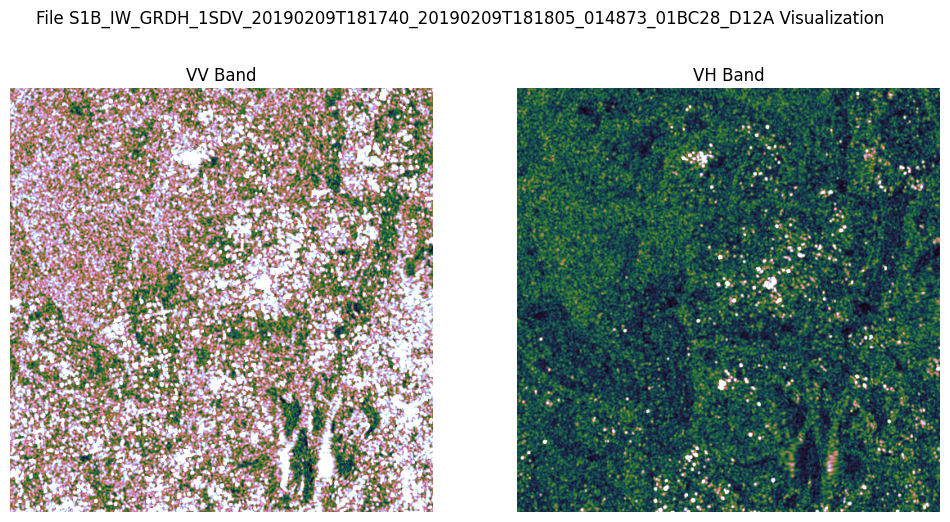

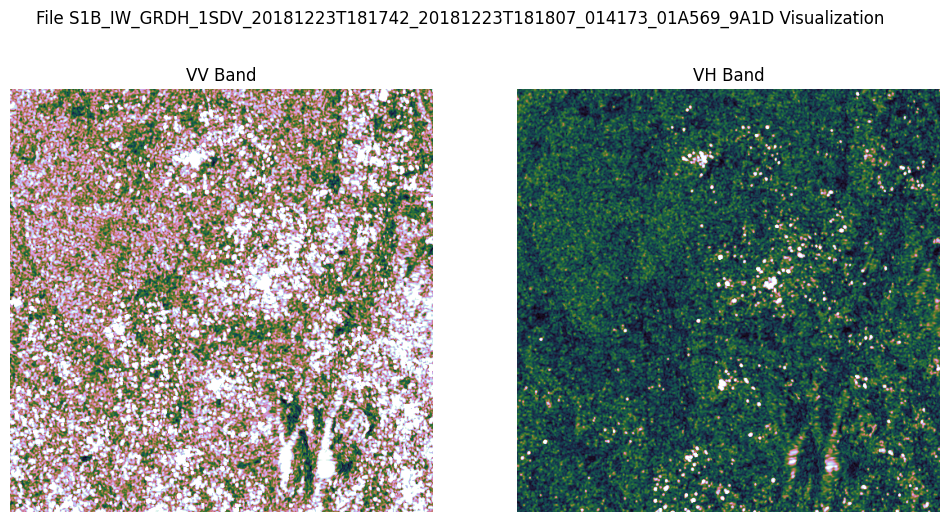

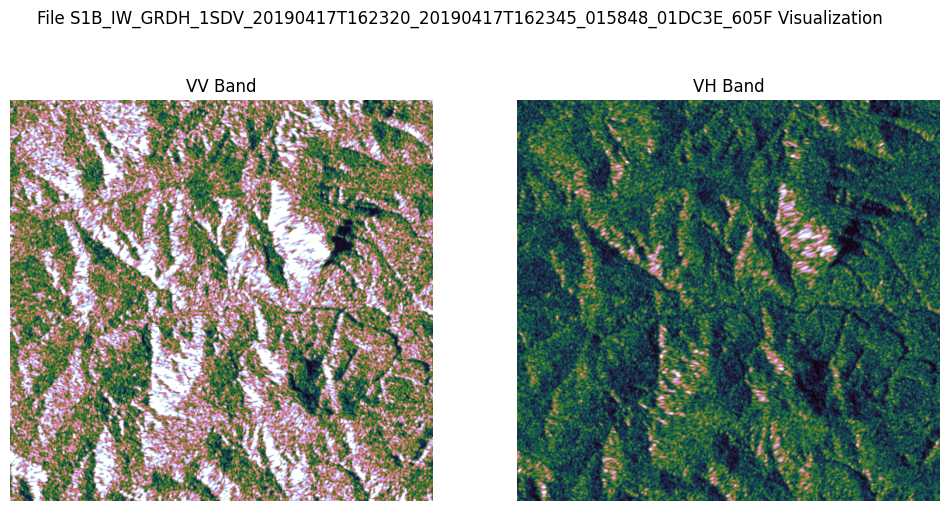

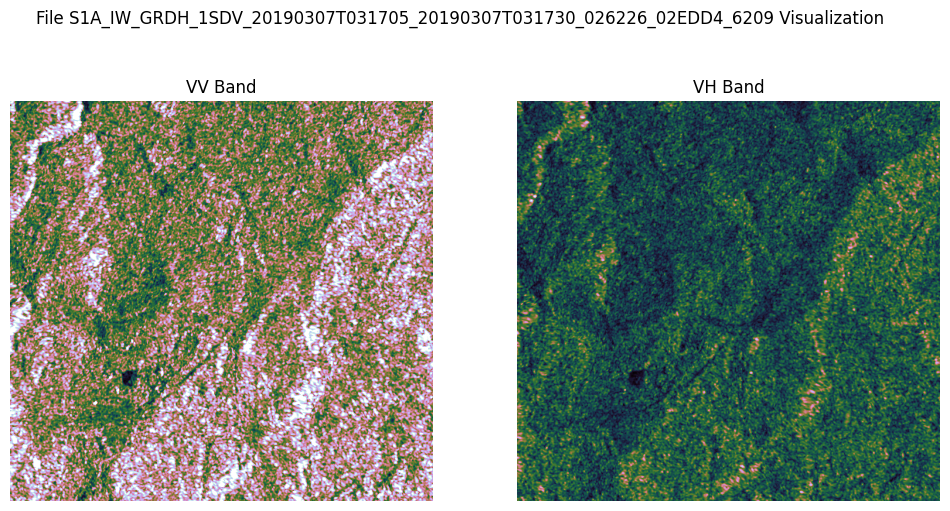

Visualization failed ./data/SEN12FLOOD/0124/S1A_IW_GRDH_1SDV_20190106T031846_20190106T031913_025351_02CE5C_29D0_corrected_VV.tif: No such file or directory


11      None
1947    None
3001    None
726     None
1575    None
3931    None
3923    None
326     None
143     None
3399    None
dtype: object

In [10]:
sample_size = 10  # Define your sample size
sampled_df = s1_df.sample(n=sample_size)

# Plot histograms for each image in the sample
sampled_df.apply(lambda row: plot_histogram(row, range=(0, 0.5)), axis=1)
sampled_df.apply(visualize_sar_image, axis=1)

In [11]:
def unique_pixel_values(file_path):
    try:
        with rasterio.open(file_path) as src:
            data = src.read(1)
            unique_values = set(np.unique(data))
            return len(unique_values)
    except Exception as e:
        print(str(e))
        return -1

In [12]:
s1_df['vv_unique_pixels'] = s1_df['vv_file_path'].apply(unique_pixel_values)
s1_df['vh_unique_pixels'] = s1_df['vh_file_path'].apply(unique_pixel_values)

./data/SEN12FLOOD/0004/S1B_IW_GRDH_1SSV_20181222T172455_20181222T172531_014157_01A4ED_D2C3_corrected_VV.tif: No such file or directory
./data/SEN12FLOOD/0004/S1B_IW_GRDH_1SSV_20190103T172455_20190103T172531_014332_01AAAE_5245_corrected_VV.tif: No such file or directory
./data/SEN12FLOOD/0004/S1A_IW_GRDH_1SDV_20190114T173346_20190114T173411_025476_02D2E1_C339_corrected_VV.tif: No such file or directory
./data/SEN12FLOOD/0004/S1A_IW_GRDH_1SDV_20190114T173411_20190114T173436_025476_02D2E1_DB2F_corrected_VV.tif: No such file or directory
./data/SEN12FLOOD/0004/S1B_IW_GRDH_1SSV_20190115T172454_20190115T172530_014507_01B057_2CF1_corrected_VV.tif: No such file or directory
./data/SEN12FLOOD/0123/S1A_IW_GRDH_1SDV_20190106T031846_20190106T031913_025351_02CE5C_29D0_corrected_VV.tif: No such file or directory
./data/SEN12FLOOD/0122/S1A_IW_GRDH_1SDV_20190106T031846_20190106T031913_025351_02CE5C_29D0_corrected_VV.tif: No such file or directory
./data/SEN12FLOOD/0100/S1B_IW_GRDH_1SDV_20190116T181741

In [13]:
s1_df

,folder,filename,date,flooding,orbit,geo_type,geo_coordinates,vv_file_path,vh_file_path,vv_file_exists,vh_file_exists,vv_height,vh_height,vv_width,vh_width,vv_unique_pixels,vh_unique_pixels
0,0063,S1B_IW_GRDH_1SDV_20190128T163241_20190128T1633...,2019-01-28,False,ASCENDING,Polygon,"[[[28.29722, -15.382762], [28.297507, -15.4290...",./data/SEN12FLOOD/0063/S1B_IW_GRDH_1SDV_201901...,./data/SEN12FLOOD/0063/S1B_IW_GRDH_1SDV_201901...,True,True,518.0,518.0,535.0,535.0,275797,275537
1,0063,S1B_IW_GRDH_1SDV_20190209T163240_20190209T1633...,2019-02-09,False,ASCENDING,Polygon,"[[[28.29722, -15.382762], [28.297507, -15.4290...",./data/SEN12FLOOD/0063/S1B_IW_GRDH_1SDV_201902...,./data/SEN12FLOOD/0063/S1B_IW_GRDH_1SDV_201902...,True,True,519.0,519.0,535.0,535.0,276340,276088
2,0200,S1A_IW_GRDH_1SDV_20190223T031705_20190223T0317...,2019-02-23,False,DESCENDING,Polygon,"[[[32.629207, -20.150871], [32.629098, -20.197...",./data/SEN12FLOOD/0200/S1A_IW_GRDH_1SDV_201902...,./data/SEN12FLOOD/0200/S1A_IW_GRDH_1SDV_201902...,True,True,516.0,516.0,548.0,548.0,280991,280829
3,0200,S1B_IW_GRDH_1SDV_20190228T162250_20190228T1623...,2019-02-28,False,ASCENDING,Polygon,"[[[32.629207, -20.150871], [32.629098, -20.197...",./data/SEN12FLOOD/0200/S1B_IW_GRDH_1SDV_201902...,./data/SEN12FLOOD/0200/S1B_IW_GRDH_1SDV_201902...,True,True,516.0,516.0,548.0,548.0,281163,281060
4,0200,S1A_IW_GRDH_1SDV_20190307T031705_20190307T0317...,2019-03-07,False,DESCENDING,Polygon,"[[[32.629207, -20.150871], [32.629098, -20.197...",./data/SEN12FLOOD/0200/S1A_IW_GRDH_1SDV_201903...,./data/SEN12FLOOD/0200/S1A_IW_GRDH_1SDV_201903...,True,True,517.0,517.0,547.0,547.0,281022,280871
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3952,29,S1A_IW_GRDH_1SDV_20190126T160455_20190126T1605...,2019-01-26,False,ASCENDING,Polygon,"[[[32.479305, 0.35084], [32.479308, 0.30452], ...",./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190126...,./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190126...,True,True,516.0,516.0,513.0,513.0,263767,263341
3953,29,S1A_IW_GRDH_1SDV_20190131T161246_20190131T1613...,2019-01-31,False,ASCENDING,Polygon,"[[[32.479305, 0.35084], [32.479308, 0.30452], ...",./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190131...,./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190131...,True,True,516.0,516.0,513.0,513.0,249320,249046
3954,29,S1A_IW_GRDH_1SDV_20190202T033603_20190202T0336...,2019-02-02,False,DESCENDING,Polygon,"[[[32.479305, 0.35084], [32.479308, 0.30452], ...",./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190202...,./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190202...,True,True,516.0,516.0,513.0,513.0,263664,263323
3955,29,S1A_IW_GRDH_1SDV_20190207T160454_20190207T1605...,2019-02-07,False,ASCENDING,Polygon,"[[[32.479305, 0.35084], [32.479308, 0.30452], ...",./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190207...,./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190207...,True,True,516.0,516.0,513.0,513.0,263740,263338


In [14]:
vv_dne_exist = (s1_df['vv_file_exists'] == False)
vh_dne_exist = (s1_df['vh_file_exists'] == False)
vv_exists = (s1_df['vv_file_exists'] == True)
vh_exists = (s1_df['vh_file_exists'] == True)

s1_dne_df = s1_df[vv_dne_exist | vh_dne_exist]
s1_filtered_df = s1_df[vv_exists & vh_exists]
s1_filtered_df

,folder,filename,date,flooding,orbit,geo_type,geo_coordinates,vv_file_path,vh_file_path,vv_file_exists,vh_file_exists,vv_height,vh_height,vv_width,vh_width,vv_unique_pixels,vh_unique_pixels
0,0063,S1B_IW_GRDH_1SDV_20190128T163241_20190128T1633...,2019-01-28,False,ASCENDING,Polygon,"[[[28.29722, -15.382762], [28.297507, -15.4290...",./data/SEN12FLOOD/0063/S1B_IW_GRDH_1SDV_201901...,./data/SEN12FLOOD/0063/S1B_IW_GRDH_1SDV_201901...,True,True,518.0,518.0,535.0,535.0,275797,275537
1,0063,S1B_IW_GRDH_1SDV_20190209T163240_20190209T1633...,2019-02-09,False,ASCENDING,Polygon,"[[[28.29722, -15.382762], [28.297507, -15.4290...",./data/SEN12FLOOD/0063/S1B_IW_GRDH_1SDV_201902...,./data/SEN12FLOOD/0063/S1B_IW_GRDH_1SDV_201902...,True,True,519.0,519.0,535.0,535.0,276340,276088
2,0200,S1A_IW_GRDH_1SDV_20190223T031705_20190223T0317...,2019-02-23,False,DESCENDING,Polygon,"[[[32.629207, -20.150871], [32.629098, -20.197...",./data/SEN12FLOOD/0200/S1A_IW_GRDH_1SDV_201902...,./data/SEN12FLOOD/0200/S1A_IW_GRDH_1SDV_201902...,True,True,516.0,516.0,548.0,548.0,280991,280829
3,0200,S1B_IW_GRDH_1SDV_20190228T162250_20190228T1623...,2019-02-28,False,ASCENDING,Polygon,"[[[32.629207, -20.150871], [32.629098, -20.197...",./data/SEN12FLOOD/0200/S1B_IW_GRDH_1SDV_201902...,./data/SEN12FLOOD/0200/S1B_IW_GRDH_1SDV_201902...,True,True,516.0,516.0,548.0,548.0,281163,281060
4,0200,S1A_IW_GRDH_1SDV_20190307T031705_20190307T0317...,2019-03-07,False,DESCENDING,Polygon,"[[[32.629207, -20.150871], [32.629098, -20.197...",./data/SEN12FLOOD/0200/S1A_IW_GRDH_1SDV_201903...,./data/SEN12FLOOD/0200/S1A_IW_GRDH_1SDV_201903...,True,True,517.0,517.0,547.0,547.0,281022,280871
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3952,29,S1A_IW_GRDH_1SDV_20190126T160455_20190126T1605...,2019-01-26,False,ASCENDING,Polygon,"[[[32.479305, 0.35084], [32.479308, 0.30452], ...",./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190126...,./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190126...,True,True,516.0,516.0,513.0,513.0,263767,263341
3953,29,S1A_IW_GRDH_1SDV_20190131T161246_20190131T1613...,2019-01-31,False,ASCENDING,Polygon,"[[[32.479305, 0.35084], [32.479308, 0.30452], ...",./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190131...,./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190131...,True,True,516.0,516.0,513.0,513.0,249320,249046
3954,29,S1A_IW_GRDH_1SDV_20190202T033603_20190202T0336...,2019-02-02,False,DESCENDING,Polygon,"[[[32.479305, 0.35084], [32.479308, 0.30452], ...",./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190202...,./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190202...,True,True,516.0,516.0,513.0,513.0,263664,263323
3955,29,S1A_IW_GRDH_1SDV_20190207T160454_20190207T1605...,2019-02-07,False,ASCENDING,Polygon,"[[[32.479305, 0.35084], [32.479308, 0.30452], ...",./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190207...,./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190207...,True,True,516.0,516.0,513.0,513.0,263740,263338


In [15]:
vv_corrupt = (s1_filtered_df['vv_unique_pixels'] == -1)
vh_corrupt = (s1_filtered_df['vh_unique_pixels'] == -1)
corrupt_files_df = s1_filtered_df[vv_corrupt | vh_corrupt]
corrupt_files_df

,folder,filename,date,flooding,orbit,geo_type,geo_coordinates,vv_file_path,vh_file_path,vv_file_exists,vh_file_exists,vv_height,vh_height,vv_width,vh_width,vv_unique_pixels,vh_unique_pixels


In [16]:
vv_blank = (s1_filtered_df['vv_unique_pixels'] == 1)
vh_blank = (s1_filtered_df['vh_unique_pixels'] == 1)
blank_files_df = s1_filtered_df[vv_blank | vh_blank]
blank_files_df = blank_files_df.drop(columns=['vh_height', 'vv_height', 'vh_width', 'vv_width', 'geo_type', 'orbit', 'geo_coordinates', 'vh_file_exists', 'vv_file_exists'])
blank_files_df


,folder,filename,date,flooding,vv_file_path,vh_file_path,vv_unique_pixels,vh_unique_pixels
48,0167,S1B_IW_GRDH_1SDV_20190314T160711_20190314T1607...,2019-03-14,True,./data/SEN12FLOOD/0167/S1B_IW_GRDH_1SDV_201903...,./data/SEN12FLOOD/0167/S1B_IW_GRDH_1SDV_201903...,1,1
67,0205,S1A_IW_GRDH_1SDV_20190313T161522_20190313T1615...,2019-03-13,False,./data/SEN12FLOOD/0205/S1A_IW_GRDH_1SDV_201903...,./data/SEN12FLOOD/0205/S1A_IW_GRDH_1SDV_201903...,1,1
119,0240,S1B_IW_GRDH_1SDV_20190412T145023_20190412T1450...,2019-04-12,False,./data/SEN12FLOOD/0240/S1B_IW_GRDH_1SDV_201904...,./data/SEN12FLOOD/0240/S1B_IW_GRDH_1SDV_201904...,1,1
147,61,S1B_IW_GRDH_1SDV_20190319T161451_20190319T1615...,2019-03-19,True,./data/SEN12FLOOD/61/S1B_IW_GRDH_1SDV_20190319...,./data/SEN12FLOOD/61/S1B_IW_GRDH_1SDV_20190319...,1,1
249,0026,S1A_IW_GRDH_1SDV_20181219T162032_20181219T1620...,2018-12-19,False,./data/SEN12FLOOD/0026/S1A_IW_GRDH_1SDV_201812...,./data/SEN12FLOOD/0026/S1A_IW_GRDH_1SDV_201812...,1,263464
...,...,...,...,...,...,...,...,...
3663,0126,S1A_IW_GRDH_1SDV_20190105T162226_20190105T1622...,2019-01-05,False,./data/SEN12FLOOD/0126/S1A_IW_GRDH_1SDV_201901...,./data/SEN12FLOOD/0126/S1A_IW_GRDH_1SDV_201901...,135761,1
3664,0126,S1A_IW_GRDH_1SDV_20190110T163034_20190110T1630...,2019-01-10,False,./data/SEN12FLOOD/0126/S1A_IW_GRDH_1SDV_201901...,./data/SEN12FLOOD/0126/S1A_IW_GRDH_1SDV_201901...,116310,1
3667,0126,S1A_IW_GRDH_1SDV_20190117T162225_20190117T1622...,2019-01-17,False,./data/SEN12FLOOD/0126/S1A_IW_GRDH_1SDV_201901...,./data/SEN12FLOOD/0126/S1A_IW_GRDH_1SDV_201901...,135475,1
3720,0220,S1A_IW_GRDH_1SDV_20190313T161522_20190313T1615...,2019-03-13,False,./data/SEN12FLOOD/0220/S1A_IW_GRDH_1SDV_201903...,./data/SEN12FLOOD/0220/S1A_IW_GRDH_1SDV_201903...,1,1


In [ ]:
from osgeo import gdal
import numpy as np

def unique_values_gdal(file_path):
    dataset = gdal.Open(file_path)
    if not dataset:
        raise FileNotFoundError(f"Unable to open file {file_path}")

    # Assuming you want to read the first band
    band = dataset.GetRasterBand(1)
    data = band.ReadAsArray()
    unique_values = set(np.unique(data))
    return len(unique_values)



In [ ]:
blank_files_df['vv_unique_pixels'] = blank_files_df['vv_file_path'].apply(unique_values_gdal)
blank_files_df['vh_unique_pixels'] = blank_files_df['vh_file_path'].apply(unique_values_gdal)

In [ ]:
blank_files_df

In [17]:
vv_blank = (s1_filtered_df['vv_unique_pixels'] == 1)
vh_blank = (s1_filtered_df['vh_unique_pixels'] == 1)
s1_filtered_df = s1_filtered_df[~(vv_blank & vh_blank)]
s1_filtered_df

,folder,filename,date,flooding,orbit,geo_type,geo_coordinates,vv_file_path,vh_file_path,vv_file_exists,vh_file_exists,vv_height,vh_height,vv_width,vh_width,vv_unique_pixels,vh_unique_pixels
0,0063,S1B_IW_GRDH_1SDV_20190128T163241_20190128T1633...,2019-01-28,False,ASCENDING,Polygon,"[[[28.29722, -15.382762], [28.297507, -15.4290...",./data/SEN12FLOOD/0063/S1B_IW_GRDH_1SDV_201901...,./data/SEN12FLOOD/0063/S1B_IW_GRDH_1SDV_201901...,True,True,518.0,518.0,535.0,535.0,275797,275537
1,0063,S1B_IW_GRDH_1SDV_20190209T163240_20190209T1633...,2019-02-09,False,ASCENDING,Polygon,"[[[28.29722, -15.382762], [28.297507, -15.4290...",./data/SEN12FLOOD/0063/S1B_IW_GRDH_1SDV_201902...,./data/SEN12FLOOD/0063/S1B_IW_GRDH_1SDV_201902...,True,True,519.0,519.0,535.0,535.0,276340,276088
2,0200,S1A_IW_GRDH_1SDV_20190223T031705_20190223T0317...,2019-02-23,False,DESCENDING,Polygon,"[[[32.629207, -20.150871], [32.629098, -20.197...",./data/SEN12FLOOD/0200/S1A_IW_GRDH_1SDV_201902...,./data/SEN12FLOOD/0200/S1A_IW_GRDH_1SDV_201902...,True,True,516.0,516.0,548.0,548.0,280991,280829
3,0200,S1B_IW_GRDH_1SDV_20190228T162250_20190228T1623...,2019-02-28,False,ASCENDING,Polygon,"[[[32.629207, -20.150871], [32.629098, -20.197...",./data/SEN12FLOOD/0200/S1B_IW_GRDH_1SDV_201902...,./data/SEN12FLOOD/0200/S1B_IW_GRDH_1SDV_201902...,True,True,516.0,516.0,548.0,548.0,281163,281060
4,0200,S1A_IW_GRDH_1SDV_20190307T031705_20190307T0317...,2019-03-07,False,DESCENDING,Polygon,"[[[32.629207, -20.150871], [32.629098, -20.197...",./data/SEN12FLOOD/0200/S1A_IW_GRDH_1SDV_201903...,./data/SEN12FLOOD/0200/S1A_IW_GRDH_1SDV_201903...,True,True,517.0,517.0,547.0,547.0,281022,280871
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3952,29,S1A_IW_GRDH_1SDV_20190126T160455_20190126T1605...,2019-01-26,False,ASCENDING,Polygon,"[[[32.479305, 0.35084], [32.479308, 0.30452], ...",./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190126...,./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190126...,True,True,516.0,516.0,513.0,513.0,263767,263341
3953,29,S1A_IW_GRDH_1SDV_20190131T161246_20190131T1613...,2019-01-31,False,ASCENDING,Polygon,"[[[32.479305, 0.35084], [32.479308, 0.30452], ...",./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190131...,./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190131...,True,True,516.0,516.0,513.0,513.0,249320,249046
3954,29,S1A_IW_GRDH_1SDV_20190202T033603_20190202T0336...,2019-02-02,False,DESCENDING,Polygon,"[[[32.479305, 0.35084], [32.479308, 0.30452], ...",./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190202...,./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190202...,True,True,516.0,516.0,513.0,513.0,263664,263323
3955,29,S1A_IW_GRDH_1SDV_20190207T160454_20190207T1605...,2019-02-07,False,ASCENDING,Polygon,"[[[32.479305, 0.35084], [32.479308, 0.30452], ...",./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190207...,./data/SEN12FLOOD/29/S1A_IW_GRDH_1SDV_20190207...,True,True,516.0,516.0,513.0,513.0,263740,263338


In [ ]:
s1_filtered_df = s1_filtered_df.sort_values(by=["folder", "filename"])
s1_filtered_df

In [ ]:
s1_filtered_df = s1_filtered_df.reset_index()
s1_filtered_df = s1_filtered_df.drop(columns="index")
s1_filtered_df

In [ ]:
s1_filtered_df.to_csv("./data/s1_filtered_df")

In [ ]:
s1_filtered_df["vv_width"].min()

In [ ]:
s1_filtered_df["vh_width"].min()

In [ ]:
s1_filtered_df["vv_height"].min()

In [ ]:
s1_filtered_df["vh_height"].min()

In [ ]:
from rasterio.enums import Resampling
from rasterio.warp import calculate_default_transform

def resize_sentinel_image(file_path, output_path, target_size=(416, 416)):
    with rasterio.open(file_path) as src:
        # Calculate scale factors
        scale_x = target_size[0] / src.width
        scale_y = target_size[1] / src.height

        # Calculate the new transform
        new_transform = src.transform * src.transform.scale(scale_x, scale_y)

        # Perform the resize operation using bicubic resampling
        data = src.read(
            out_shape=(src.count, target_size[1], target_size[0]),
            resampling=Resampling.cubic
        )

        # Update metadata
        metadata = src.meta.copy()
        metadata.update({
            "driver": "GTiff",
            "height": target_size[1],
            "width": target_size[0],
            "transform": new_transform
        })

        # Save the resized image
        with rasterio.open(output_path, 'w', **metadata) as dst:
            dst.write(data)

In [ ]:
vv_file_paths = s1_filtered_df['vv_file_path'].to_list()
vh_file_paths = s1_filtered_df['vh_file_path'].to_list()

In [ ]:
vv_file_paths[0]

In [ ]:
for file_path in vv_file_paths:
    parts = file_path.rsplit('.', 1)
    output_path = f"{parts[0]}_resampled.{parts[1]}"
    resize_sentinel_image(file_path, output_path)

In [ ]:
for file_path in vh_file_paths:
    parts = file_path.rsplit('.', 1)
    output_path = f"{parts[0]}_resampled.{parts[1]}"
    resize_sentinel_image(file_path, output_path)

In [ ]:
def get_resampled_filepaths(file_path):
    parts = file_path.rsplit('.', 1)
    output_path = f"{parts[0]}_resampled.{parts[1]}"
    return output_path

In [ ]:
s1_resampled_df = s1_filtered_df
s1_resampled_df['vv_file_path'] = s1_resampled_df['vv_file_path'].apply(get_resampled_filepaths)
s1_resampled_df['vh_file_path'] = s1_resampled_df['vh_file_path'].apply(get_resampled_filepaths)


In [ ]:
s1_resampled_df

In [ ]:

s1_resampled_df['vv_height'] = s1_resampled_df.apply(lambda row: get_height(row, 'vv'), axis=1)
s1_resampled_df['vh_height'] = s1_resampled_df.apply(lambda row: get_height(row, 'vh'), axis=1)
s1_resampled_df['vv_width'] = s1_resampled_df.apply(lambda row: get_width(row, 'vv'), axis=1)
s1_resampled_df['vh_width'] = s1_resampled_df.apply(lambda row: get_width(row, 'vh'), axis=1)

In [ ]:
s1_resampled_df

In [ ]:
condition1 = (s1_resampled_df['vv_unique_pixels'] > 100)
condition2 = (s1_resampled_df['vh_unique_pixels'] > 100)
s1_resampled_quality_df = s1_resampled_df[condition1 & condition2]
s1_resampled_quality_df = s1_resampled_quality_df.reset_index()

In [ ]:
s1_resampled_quality_df.to_csv("./data/s1_resampled_quality_df.csv")

In [ ]:
sample_size = 10  # Define your sample size
sampled_df = s1_resampled_quality_df.sample(n=sample_size)

# Plot histograms for each image in the sample
sampled_df.apply(lambda row: plot_histogram(row, range=(0, 0.5)), axis=1)
sampled_df.apply(visualize_sar_image, axis=1)

In [ ]:
s1_flood_quality_labels = pd.DataFrame(columns=['flooding'])
s1_flood_quality_labels['flooding'] = s1_resampled_quality_df['flooding'].apply(lambda label: int(label))
s1_flood_quality_labels

In [ ]:
s1_flood_quality_labels_array = s1_flood_quality_labels['flooding'].to_numpy()

In [ ]:
s1_flood_quality_labels_array

In [ ]:
s1_flood_quality_labels_array.shape

In [ ]:
s1_flood_quality_labels_array.dtype

In [ ]:
s1_flood_quality_labels_array = s1_flood_quality_labels_array.astype(np.int8)
s1_flood_quality_labels_array.dtype

In [ ]:
np.save("./data/s1_flood_quality_labels.npy", s1_flood_quality_labels_array)

In [ ]:
s1_resampled_quality_flood_images = np.empty(shape=(3700, 416, 416, 2))

In [ ]:
def read_band(row):
    vv_file_path = row['vv_file_path']
    vh_file_path = row['vh_file_path']
    
    try:
        with rasterio.open(vv_file_path) as src:
            vv_band = src.read(1)
        with rasterio.open(vh_file_path) as src:
            vh_band = src.read(1)
        return np.stack((vv_band, vh_band), axis=-1)
    except Exception as e:
        print(f"Error processing file {row['filename']}: {e}")
        return None

In [ ]:
image_data_list = s1_resampled_quality_df.apply(read_band, axis=1).tolist()

In [ ]:
len(image_data_list)

In [ ]:
for i, image in enumerate(image_data_list):
    s1_resampled_quality_flood_images[i] = image

s1_resampled_quality_flood_images

In [ ]:
s1_resampled_quality_flood_images = s1_resampled_quality_flood_images.astype(np.float32)

np.save("./data/s1_resampled_quality_flood_images.npy", s1_resampled_quality_flood_images)

In [ ]:
orbits = {
    'DESCENDING': 0,
    'ASCENDING':1
}
quality_img_orbits = s1_resampled_quality_df['orbit'].apply(lambda label: orbits[label])
quality_img_orbits

In [ ]:
quality_img_orbits_array = quality_img_orbits.to_numpy()

In [ ]:
quality_img_orbits_array = quality_img_orbits_array.astype(np.int8)

In [ ]:
quality_img_orbits_array

In [ ]:
np.save("./data/s1_quality_img_orbits_array.npy", quality_img_orbits_array)

In [ ]:
s1_resampled_quality_flood_images.dtype

In [ ]:
import numpy as np
s1_resampled_quality_flood_images = np.load("./data/s1_resampled_quality_flood_images.npy")

In [ ]:
print(s1_resampled_quality_flood_images.min())
print(s1_resampled_quality_flood_images.max())

In [ ]:
# Calculate percentiles
p5 = np.percentile(s1_resampled_quality_flood_images, 5)
p25 = np.percentile(s1_resampled_quality_flood_images, 25)  # 25th percentile
p50 = np.percentile(s1_resampled_quality_flood_images, 50)  # 50th percentile, also the median
p75 = np.percentile(s1_resampled_quality_flood_images, 75) # 75th percentile
p95 = np.percentile(s1_resampled_quality_flood_images, 95) 

print("5th percentile:", p5)
print("25th percentile:", p25)
print("50th percentile (median):", p50)
print("75th percentile:", p75)
print("95th percentile:", p95)

In [ ]:
flattened_data_vv = s1_resampled_quality_flood_images[:,:,:,0].reshape(-1)
flattened_data_vh = s1_resampled_quality_flood_images[:,:,:,1].reshape(-1)
p1vv = np.percentile(flattened_data_vv, 1)
p99vv = np.percentile(flattened_data_vv, 98)
p1vh = np.percentile(flattened_data_vh, 1)
p99vh = np.percentile(flattened_data_vh, 98)

print(f"First vv {p1vv}, First vh {p1vh}, 98th vv {p99vv}, 98th vh {p99vh}")

In [ ]:
from sklearn.preprocessing import MinMaxScaler
# Assuming 'data' is your array of shape (3700, 416, 416, 2)
data = s1_resampled_quality_flood_images # Your data here

clipped_data = np.clip(data, 0, 1.07)

# Merging the channels back together

# Initialize the StandardScaler

# scaler = MinMaxScaler()
# processed_data = []
# # Process each image
# processed_data = []
# for image in data:

#     # Apply MinMaxScaler
#     scaled_image1 = scaler.fit_transform(image[:,:,0])
#     scaled_image2 = scaler.fit_transform(image[:,:,1])

#     # Reshape back to original shape and append to the list
#     processed_data.append(np.stack((scaled_image1, scaled_image2), axis=-1))

In [ ]:
# # Reshape back to original shape
processed_data = np.array(processed_data)
print(processed_data.shape)


In [ ]:
import matplotlib.pyplot as plt

def visualize_sar_image(img, i):
    try:

        # Plotting
        fig, ax = plt.subplots(1, 2, figsize=(12, 6))

        # Visualize VV band
        vv_band = img[:, :, 0]
        ax[0].imshow(vv_band, cmap='cubehelix')
        ax[0].set_title('VV Band')
        ax[0].axis('off')

        # Visualize VH band
        vh_band = img[:, :, 1]
        ax[1].imshow(vh_band, cmap='cubehelix')
        ax[1].set_title('VH Band')
        ax[1].axis('off')

        fig.suptitle(f"Normalized Image Visualization", fontsize=12)
        
        plt.savefig(f"normalized_image{i}_visualization.png")
        plt.show()
    except Exception as e:
        print(f"Visualization failed {str(e)}")

In [ ]:
processed_data = clipped_data

sample_size = 10  # Define your sample size
sampled_indices = np.random.choice(processed_data.shape[0], sample_size, replace=False)
sampled_images = processed_data[sampled_indices]
for i in range(sampled_images.shape[0]):
    img = sampled_images[i]
    visualize_sar_image(img, i)

In [ ]:
print(processed_data.min())
print(processed_data.max())

In [ ]:
def plot_histogram(img, i):
    try:
        vv_band = img[:, :, 0]
        vh_band = img[:, :, 1]
        fig, axs = plt.subplots(1, 2, figsize=(15, 5))
    
        axs[0].hist(vv_band.ravel(), bins=256, range=(0,1))  # Adjust range as needed
        axs[0].set_title(f'Normalized Band VV Histogram')
        
        axs[1].hist(vh_band.ravel(), bins=256, range=(0,1))  # Adjust range as needed
        axs[1].set_title(f'Normalized Band VH Histogram')
    
        fig.suptitle(f"Sample {i} Normalized Pixel Histogram", fontsize=12)
        
        plt.tight_layout()
        plt.savefig(f"sample_{i}_normalized_pixel_histogram.png")
        plt.show()
    except Exception as e:
        print(f"Plot failed {str(e)}")

In [ ]:
for i in range(sampled_images.shape[0]):
    img = sampled_images[i]
    plot_histogram(img, i)

In [ ]:
num_outliers = np.sum((s1_resampled_quality_flood_images < 0) | (s1_resampled_quality_flood_images > 1))

In [ ]:
num_outliers

In [ ]:
data = s1_resampled_quality_flood_images
data_min = np.min(data)
data_max = np.max(data)
data_mean = np.mean(data)
data_median = np.median(data)
data_std = np.std(data)

print("Min:", data_min)
print("Max:", data_max)
print("Mean:", data_mean)
print("Median:", data_median)
print("Std:", data_std)

# Calculate percentiles
percentiles = np.percentile(data, [1, 5, 95, 99])
print("1st, 5th, 95th, 99th percentiles:", percentiles)

# Histogram of pixel values
plt.hist(data.ravel(), bins=50, range=(0,1))
plt.title("Histogram of Pixel Values")
plt.show()

# Box plot
plt.boxplot(data.ravel())
plt.title("Box Plot of Pixel Values")
plt.show()

# Count number of outliers
num_outliers = np.sum((data < 0) | (data > 1))
print("Number of outliers:", num_outliers)

# Visual inspection of a random image
plt.imshow(data[np.random.randint(data.shape[0])], cmap='gray')
plt.title("Random Image Sample")
plt.show()

In [ ]:
3700 * 2 * 416 * 416

In [ ]:
8279045/1280614400

In [ ]:
0.006464900753888133 * 100

In [ ]:
clipped_data.dtype

In [ ]:
np.save("./data/s1_resampled_quality_clipped_flood_images.npy", clipped_data)